#TKO_3120 Machine Learning and Pattern Recognition

## Image recognition exercise


## Introduction

This project focuses on classifying three types of images: grass, sand, and stairs using machine learning techniques. The purpose is to develop a model that can accurately identify and categorize these different textures based on their visual characteristics.
The dataset consists of images gathered from Unsplash (https://unsplash.com/), a platform for high-quality stock photographs. These images are provided as URLs in text files, one for each category (grass, sand, and stairs). The images vary in resolution and dimensions, presenting a preprocessing challenge that needs to be addressed.
The project follows the following steps:
1. **Data Preparation**: Loading images from URLs, standardizing their dimensions, and converting to grayscale when needed.
2. **Feature Extraction**: Computing both first-order features (color statistics) and second-order features (texture patterns using GLCM).
3. **Exploratory Data Analysis**: Visualizing feature distributions and relationships through histograms, correlation matrices, and PCA.
4. **Model Selection**: Training and evaluating three different classifiers (Ridge Classifier, Random Forest, and MLP) using nested cross-validation.
5. **Performance Assessment**: Comparing models based on accuracy metrics and confusion matrices.

The goal is to identify the most effective approach for this image classification task and understand which features contribute most significantly to accurate classification.

## Mount Drive


In [88]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Installation & Package Import

In [ ]:
!pip install Pillow==9.5.0

In [116]:
import os
import re
from PIL import Image
import requests
import cv2
import numpy as np
from skimage.feature import graycomatrix, graycoprops, local_binary_pattern
from skimage.filters import sobel
from skimage import io
import pandas as pd
import matplotlib.pyplot as plt
import requests
from io import BytesIO
from skimage import io, color, transform, exposure
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold


# Data preparation

## A. Import the images url from text file & adjust dimensions

The "*root_path*" folder should contain the three text files for grass, sand, & stairs. Change path as per your need

In [90]:
#current file directory with the
root_path = "/content/drive/MyDrive/Colab Notebooks/MLPR_excercise"

image_url_dict = {}

# Iterate through files in the folder
for filename in os.listdir(root_path):
    if filename.endswith(".txt"):
        print(f'Reading: {filename}')
        file_path = os.path.join(root_path, filename)
        image_list = []
        with open(file_path, 'r') as f:
            lines = f.read().splitlines()
            for line in lines:
                # Adding query param to url to make 244x244 square image which optimises the download time.
                line = re.sub(r'(?<=[\?&])w=\d+', 'w=244&h=244', line)
                image_list.append(line)
        image_url_dict[filename] = image_list

Reading: grass.txt
Reading: sand.txt
Reading: stairs.txt


In [91]:
grass_urls = image_url_dict.get("grass.txt", [])
sand_urls = image_url_dict.get("sand.txt", [])
stairs_urls = image_url_dict.get("stairs.txt", [])

# print(image_url_dict)
print(f"Number of grass images: {len(grass_urls)}")
print(f"Number of sand images: {len(sand_urls)}")
print(f"Number of stairs images: {len(stairs_urls)}")

Number of grass images: 62
Number of sand images: 61
Number of stairs images: 62


## B. Download Images

In [92]:
download_root_dir = os.path.join(root_path, 'Data')
if not os.path.exists(download_root_dir):
    os.makedirs(download_root_dir)

image_files_dict = {}

for filename, image_url_list in image_url_dict.items():
    subfolder_name = filename.split('.')[0]
    subfolder_path = os.path.join(download_root_dir, subfolder_name)
    if not os.path.exists(subfolder_path):
        os.makedirs(subfolder_path)
    print(f'\n Processing: {subfolder_path} \n')

    image_path_list = []

    for url in image_url_list:
      try:
          # Download the image
          response = requests.get(url, stream=True)
          response.raise_for_status()  # Raise an exception for bad responses

          # Get the image filename from the URL
          image_filename = os.path.basename(url).split('?')[0]

          # Save the image
          image_path = os.path.join(subfolder_path, image_filename)

          #if path exists already move to next
          if os.path.exists(image_path):
            image_path_list.append(image_path)
            continue

          with open(image_path, 'wb') as f:
              for chunk in response.iter_content(chunk_size=1024):
                  f.write(chunk)

          print(f"Downloaded {image_filename} to {subfolder_path}")
          image_path_list.append(image_path)

      except requests.exceptions.RequestException as e:
          print(f"Error downloading {url}: {e}")
      except Exception as e:
          print(f"Error processing {url}: {e}")
    image_files_dict[subfolder_name] = image_path_list



 Processing: /content/drive/MyDrive/Colab Notebooks/MLPR_excercise/Data/grass 


 Processing: /content/drive/MyDrive/Colab Notebooks/MLPR_excercise/Data/sand 


 Processing: /content/drive/MyDrive/Colab Notebooks/MLPR_excercise/Data/stairs 



In [93]:
grass_paths = image_files_dict.get("grass", [])
sand_paths = image_files_dict.get("sand", [])
stairs_paths = image_files_dict.get("stairs", [])

# print(image_files_dict)
print(f"Number of grass images: {len(grass_paths)}")
print(f"Number of sand images: {len(sand_paths)}")
print(f"Number of stairs images: {len(stairs_paths)}")

Number of grass images: 62
Number of sand images: 61
Number of stairs images: 62


## C. Preprocess Images

preprocess_image : This fn does the following :-
* Stored as 3 dimensional arrays
* [height, width, color channel]
* Pixel values as 8-bit unsigned integers: [0,255]

convert_to_grayscale: Converts the image to grayscale images



In [94]:
def preprocess_image(img, target_size=(128, 128)):
    if img is None:
        return None

    # Handle grayscale images
    if len(img.shape) == 2:
        img = np.stack((img,) * 3, axis=-1)

    # Handle RGBA images
    if img.shape[2] == 4:
        img = img[:, :, :3]

    # Resize the image to target size
    img_resized = transform.resize(img, target_size, anti_aliasing=True)

    # Ensure pixel values are in range [0, 255]
    img_resized = (img_resized * 255).astype(np.uint8)

    return img_resized

In [95]:
def convert_to_grayscale(img, levels=8):
    if img is None:
        return None

    # Convert to grayscale
    gray_img = color.rgb2gray(img)

    # Scale to [0, levels-1]
    gray_img = (gray_img * (levels - 1)).astype(np.uint8)

    return gray_img

*Example of Preprocessing*

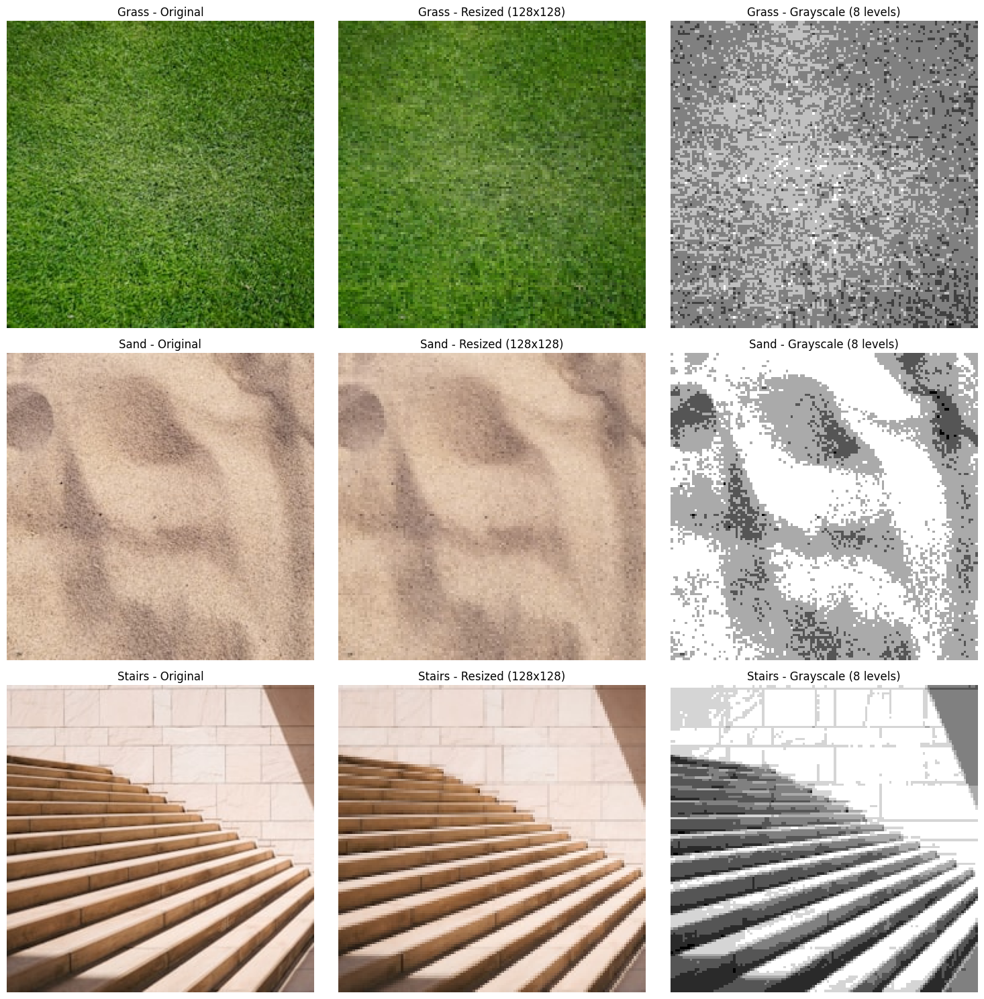

In [96]:
def show_preprocessing_examples():
    # Take one example from each category
    example_paths = {
        'Grass': grass_paths[0] if  grass_paths else None,
        'Sand': sand_paths[0] if sand_paths else None,
        'Stairs': stairs_paths[0] if stairs_paths else None
    }

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    for i, (category, path) in enumerate(example_paths.items()):
        if path:
            # get image from directory
            img = io.imread(path)
            if img is not None:
                processed_img = preprocess_image(img)
                gray_img = convert_to_grayscale(processed_img)

                # Original image
                axes[i, 0].imshow(img)
                axes[i, 0].set_title(f"{category} - Original")
                axes[i, 0].axis('off')

                # Resized image
                axes[i, 1].imshow(processed_img)
                axes[i, 1].set_title(f"{category} - Resized (128x128)")
                axes[i, 1].axis('off')

                # Grayscale with reduced quantization
                axes[i, 2].imshow(gray_img, cmap='gray')
                axes[i, 2].set_title(f"{category} - Grayscale (8 levels)")
                axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

show_preprocessing_examples()


## D. GLCM (Gray Level Co-occurrence Matrix)

#### What is GLCM?
The Gray Level Co-occurrence Matrix (GLCM) is a statistical method for examining texture by analyzing the spatial relationships between pixels at specified positions relative to each other.
For this excercise we are going to analyse the following properties


1. Correlation: Measures linear dependencies between neighboring pixels (values closer to 1 indicate stronger dependencies)
2. Contrast: Measures local variations (higher values indicate more contrast/sharper transitions)
3. Dissimilarity: Similar to contrast but with linear weighting (measures how different neighboring pixel pairs are)
4. Homogeneity: Measures closeness of distribution to diagonal (higher values indicate smoother textures)
5. ASM (Angular Second Moment): Measures uniformity (higher values indicate more uniform/simpler textures)



In [97]:
# **CONFIGS***
angles = [0, np.pi/2] # 0° (horizontal) and 90° (vertical) directions
distances = [1, 2] # Analysis at 1 and 2 pixel distances

In [98]:
def extract_glcm_features(gray_img, distances):
    if gray_img is None:
        return None

    # Generate GLCM
    glcm = graycomatrix(gray_img, distances=distances, angles=angles, symmetric=True, normed=True)

    # Calculate GLCM properties
    correlation = graycoprops(glcm, 'correlation')
    contrast = graycoprops(glcm, 'contrast')
    dissimilarity = graycoprops(glcm, 'dissimilarity')
    homogeneity = graycoprops(glcm, 'homogeneity')
    asm = graycoprops(glcm, 'ASM')

    # Flatten the features
    features = {
        'correlation': correlation.flatten(),
        'contrast': contrast.flatten(),
        'dissimilarity': dissimilarity.flatten(),
        'ASM': asm.flatten(),
        'homogeneity': homogeneity.flatten(),
    }

    return features


#### Correlation vs. Distance Analysis
The *plot_correlation_graph* function visualizes how pixel relationships change with distance.
This visualization reveals how quickly correlation decays with distance in different directions, which helps identify:
* Scale of texture patterns (fine vs. coarse)
* Directional nature of textures (isotropic vs. anisotropic)
* Periodicity in textures (if present)

In [99]:
def plot_correaltion_graph(quantized_gs_img):
    correlations = {angle: [] for angle in angles}  # Store correlations for horizontal and vertical
    max_distance = int(min(quantized_gs_img.shape[0], quantized_gs_img.shape[1]))
    distances = list(range(1, max_distance))

    for distance in distances:
        glcm_props = extract_glcm_features(quantized_gs_img, distances=[distance])
        for angle, corr_value in zip(angles, glcm_props['correlation']):
            correlations[angle].append(corr_value)

    # Plot correlations for horizontal and vertical directions
    plt.figure(figsize=(12, 5))  # Adjust figure size as needed

    plt.plot(distances, correlations[0], label='Horizontal (0 radians)')
    plt.plot(distances, correlations[np.pi/2], label='Vertical (π/2 radians)')

    plt.title('Correlation vs. Distance')
    plt.xlabel('Reference Distance (Pixels)')
    plt.ylabel('Correlation')
    # plt.grid(True)
    plt.legend()  # Show legend for horizontal and vertical

    plt.tight_layout()
    plt.show()

In [100]:
def analyze_image(image_path):
    # Load the image using OpenCV
    img = cv2.imread(image_path)

    if img is None:
        print(f"Failed to load image: {image_path}")
        return None, None

    #preprocess & convert to grayscale
    img = preprocess_image(img)
    quantized_gs_img = convert_to_grayscale(img)

    plot_correaltion_graph(quantized_gs_img)

    # Calculate GLCM
    glcm_props = extract_glcm_features(quantized_gs_img, distances)

    return glcm_props

Example of analysed image from each class


 Analyzing images in grass


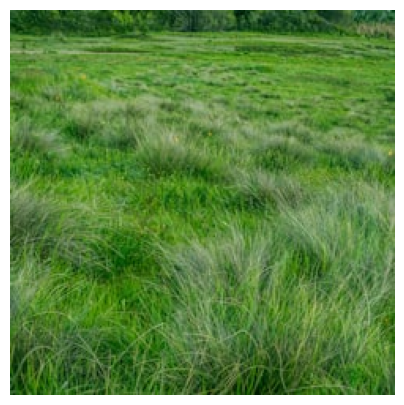

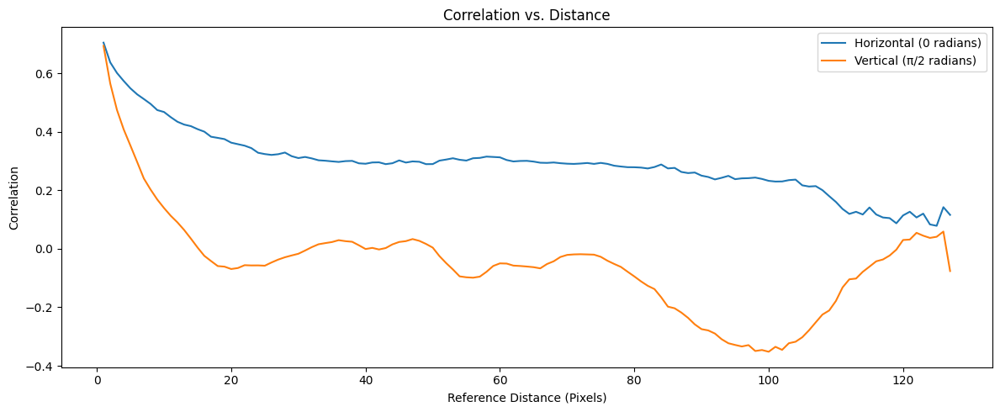

  Image: photo-1567459169668-95d355371bda
    GLCM correlation: [0.70465144 0.69375232 0.63707192 0.56475649]
    GLCM contrast: [0.29293799 0.30050443 0.35974702 0.42224702]
    GLCM dissimilarity: [0.28629429 0.29422982 0.34598214 0.39645337]
    GLCM ASM: [0.24151339 0.23804301 0.21972509 0.20668034]
    GLCM homogeneity: [0.85751722 0.85351255 0.82838542 0.80435268]

 Analyzing images in sand


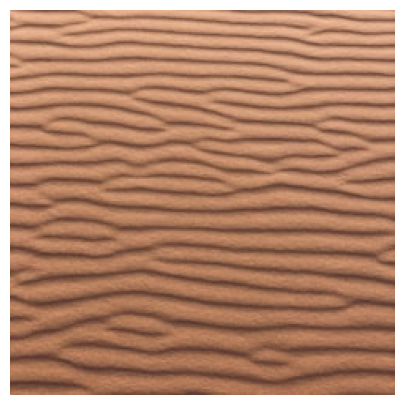

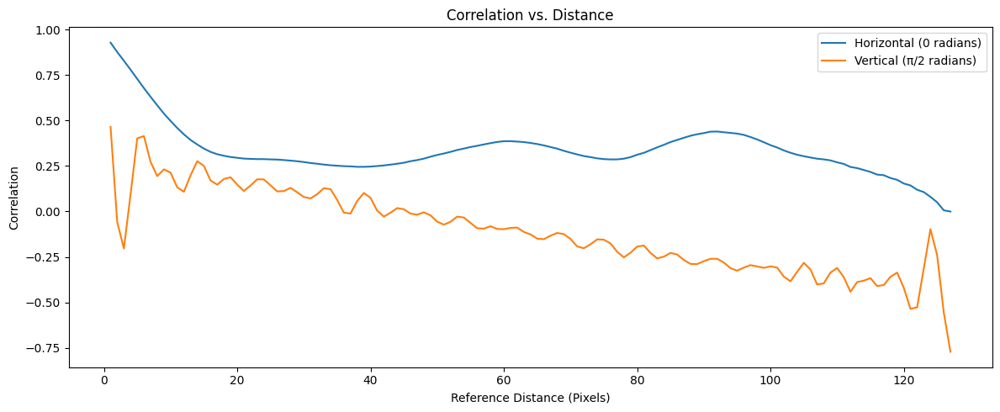

  Image: photo-1534171472159-edb6d1e0b63c
    GLCM correlation: [ 0.9278619   0.46511816  0.87619041 -0.05880868]
    GLCM contrast: [0.0867372  0.64234744 0.14874752 1.26804315]
    GLCM dissimilarity: [0.0867372  0.56631398 0.1484995  0.89440724]
    GLCM ASM: [0.29994062 0.14482262 0.26644811 0.12686947]
    GLCM homogeneity: [0.9566314  0.72444636 0.92577505 0.59015997]

 Analyzing images in stairs


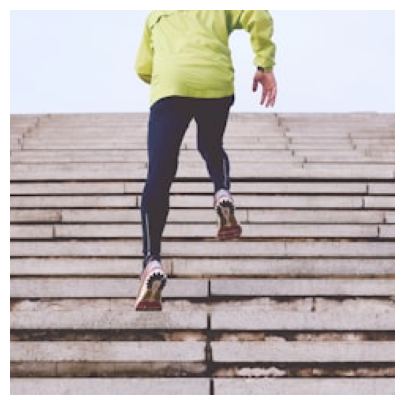

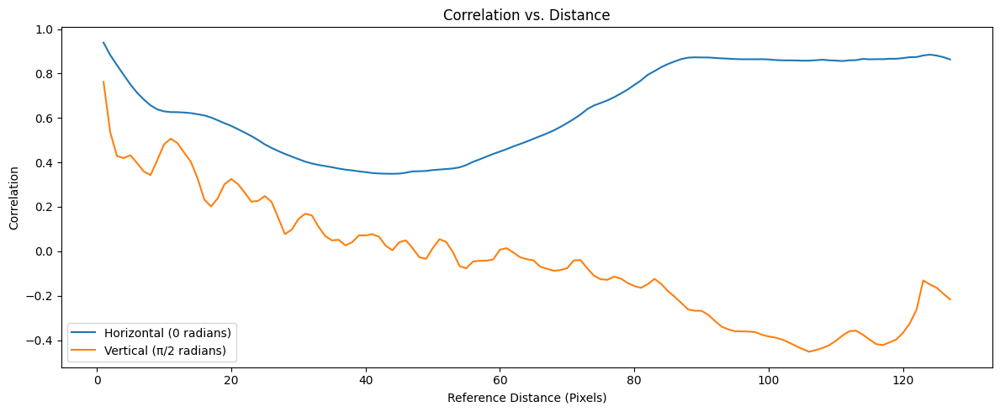

  Image: photo-1502101872923-d48509bff386
    GLCM correlation: [0.9387569  0.76192611 0.88275017 0.53517225]
    GLCM contrast: [0.28734006 1.11897146 0.55059524 2.19078621]
    GLCM dissimilarity: [0.17575049 0.57726378 0.27566964 0.90531994]
    GLCM ASM: [0.18840896 0.13235958 0.17158493 0.09989955]
    GLCM homogeneity: [0.92287086 0.7649373  0.88783028 0.66974271]


In [101]:
# ********************** SAMPLE ANALYSIS CALLER CODE **********************************
for folder in os.listdir(download_root_dir):
    folder_path = os.path.join(download_root_dir, folder)
    print(f"\n Analyzing images in {folder}")
    if os.path.isdir(folder_path):

        files = os.listdir(folder_path)
        if files:
            image_path = os.path.join(folder_path, files[10])
            # Display the image
            fig, ax = plt.subplots(1, 1, figsize=(5, 5))
            ax.imshow(io.imread(image_path))
            ax.axis('off')

            if os.path.isfile(image_path):
                glcm_results = analyze_image(image_path)
                if glcm_results is not None:
                    print(f"  Image: {files[0]}")
                    for prop_name, prop_value in glcm_results.items():
                        print(f"    GLCM {prop_name}: {prop_value}")

Based on analysing the correlation plots for many images by changing the file above. It can be observed that :

Grass images: Typically show a high homogenity.

Sand images: Usually have less consistent correlation values this may be due to granular texture of sand.

Stairs images: Often exhibit strong directional patterns with high contrast in one direction.

# Feature extraction

### First order texture measures (6 features)

- Calculate the below mentioned color features for each image **(1 p)**
    - Mean for each RGB color channel
    - Variance for each RGB color channel

In [ ]:
def extract_color_features(img):
    if img is None:
        return None

    # Calculate mean and variance
    means = np.mean(img, axis=(0, 1))
    variances = np.var(img, axis=(0, 1))

    features = {
        'mean_r': means[0],
        'mean_g': means[1],
        'mean_b': means[2],
        'var_r': variances[0],
        'var_g': variances[1],
        'var_b': variances[2]
    }

    return features

### Second order texture measures (4 features)

The function "*extract_features*" preprocesses the image and then extract first order features & GLCM features then combones them. Distances are chosen to capture both immediate neighbor relationships (1 pixel) and slightly more distant patterns (2 pixels) which helps in detecting different texture scales present in the images.

In [ ]:
def extract_features(img):
    if img is None:
        return None

    # Preprocess image
    processed_img = preprocess_image(img)
    if processed_img is None:
        return None

    # Extract color features
    color_feats = extract_color_features(processed_img)

    # Convert to grayscale
    gray_img = convert_to_grayscale(processed_img, levels=8)

    # Extract GLCM features - using distances 1 and 2 pixels
    # Distances are chosen to capture both immediate neighbor relationships (1 pixel)
    # and slightly more distant patterns (2 pixels) which helps in detecting
    # different texture scales present in the images
    glcm_feats = extract_glcm_features(gray_img, distances)

    if color_feats is None or glcm_feats is None:
        return None

    # Combine all features
    features = {**color_feats}

    for i, corr in enumerate(glcm_feats['correlation']):
        features[f'corr_{i}'] = corr

    # Add additional GLCM features
    for i, contrast in enumerate(glcm_feats['contrast']):
        features[f'contrast_{i}'] = contrast

    for i, dissimilarity in enumerate(glcm_feats['dissimilarity']):
        features[f'dissimilarity_{i}'] = dissimilarity

    for i, homogeneity in enumerate(glcm_feats['homogeneity']):
        features[f'homogeneity_{i}'] = homogeneity

    for i, asm in enumerate(glcm_feats['ASM']):
        features[f'ASM_{i}'] = asm

    return features

This function processes the image path for give sample size

In [ ]:
def process_image_set(image_paths, label, sample_size=None):
    if sample_size is not None:
        image_paths = image_paths[:sample_size]

    all_features = []

    for i, path in enumerate(image_paths):
        print(f"Processing {label} image {i+1}/{len(image_paths)}")
        img = io.imread(path)

        if img is not None:
            features = extract_features(img)

            if features is not None:
                features['label'] = label
                all_features.append(features)

    return all_features

The main calling code which processes all the images.

In [ ]:
## ************* MAIN IMAGE PROCESSING CALLER CODE ****************************
sample_size = 60  # You can increase this for better results
grass_features = process_image_set(grass_paths, 'grass', sample_size)
sand_features = process_image_set(sand_paths, 'sand', sample_size)
stairs_features = process_image_set(stairs_paths, 'stairs', sample_size)

all_features = grass_features + sand_features + stairs_features
features_df = pd.DataFrame(all_features)

print(f"Dataset shape: {features_df.shape}")
print(features_df.info())

# Check class distribution
print(features_df['label'].value_counts())

In [102]:
# Prepare data for classification
X = features_df.drop(columns=['label'])
y = features_df['label']

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

# Feature relationships (EDA)

### Pairplot

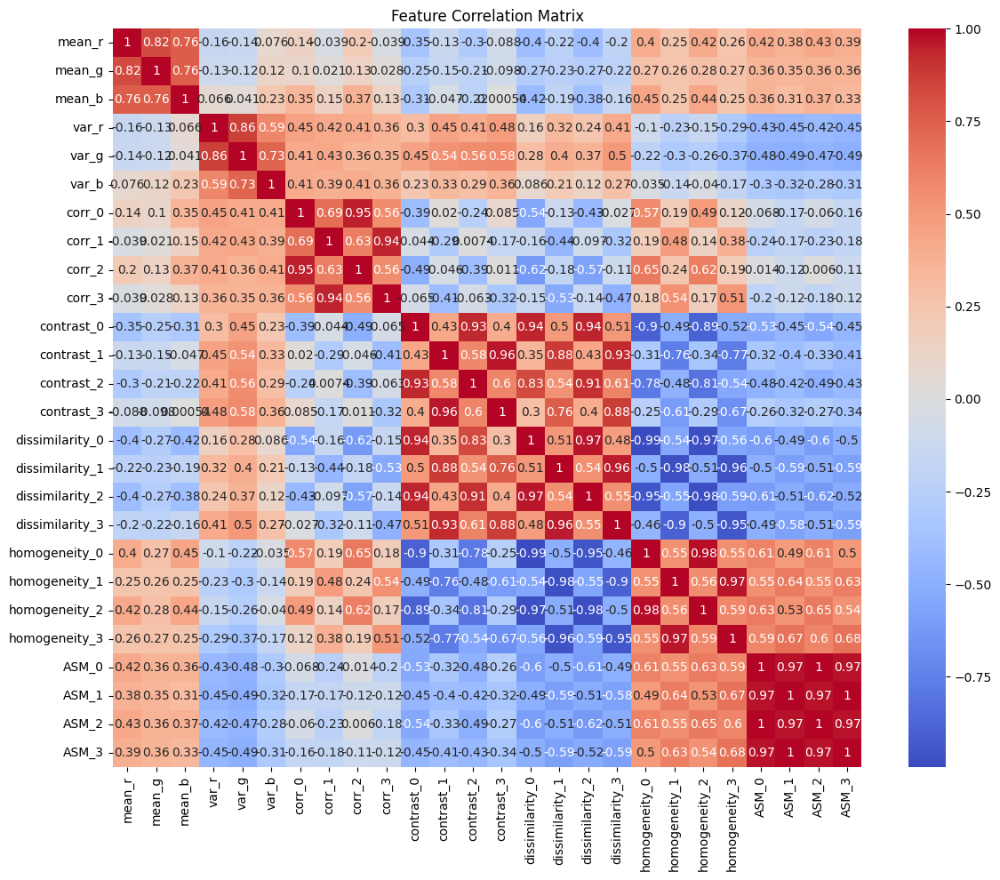

Features with nearly linear correlation (threshold = 0.7):
mean_r and mean_g
mean_g and mean_r
var_r and var_g
var_g and var_r
corr_0 and corr_2
corr_1 and corr_3
corr_2 and corr_0
corr_3 and corr_1
contrast_0 and contrast_2
contrast_0 and dissimilarity_0
contrast_0 and dissimilarity_2
contrast_0 and homogeneity_0
contrast_0 and homogeneity_2
contrast_1 and contrast_3
contrast_1 and dissimilarity_1
contrast_1 and dissimilarity_3
contrast_2 and contrast_0
contrast_2 and dissimilarity_0
contrast_2 and dissimilarity_2
contrast_2 and homogeneity_2
contrast_3 and contrast_1
contrast_3 and dissimilarity_3
dissimilarity_0 and contrast_0
dissimilarity_0 and contrast_2
dissimilarity_0 and dissimilarity_2
dissimilarity_0 and homogeneity_0
dissimilarity_0 and homogeneity_2
dissimilarity_1 and contrast_1
dissimilarity_1 and dissimilarity_3
dissimilarity_1 and homogeneity_1
dissimilarity_1 and homogeneity_3
dissimilarity_2 and contrast_0
dissimilarity_2 and contrast_2
dissimilarity_2 and dissimilar

<Figure size 1200x1000 with 0 Axes>

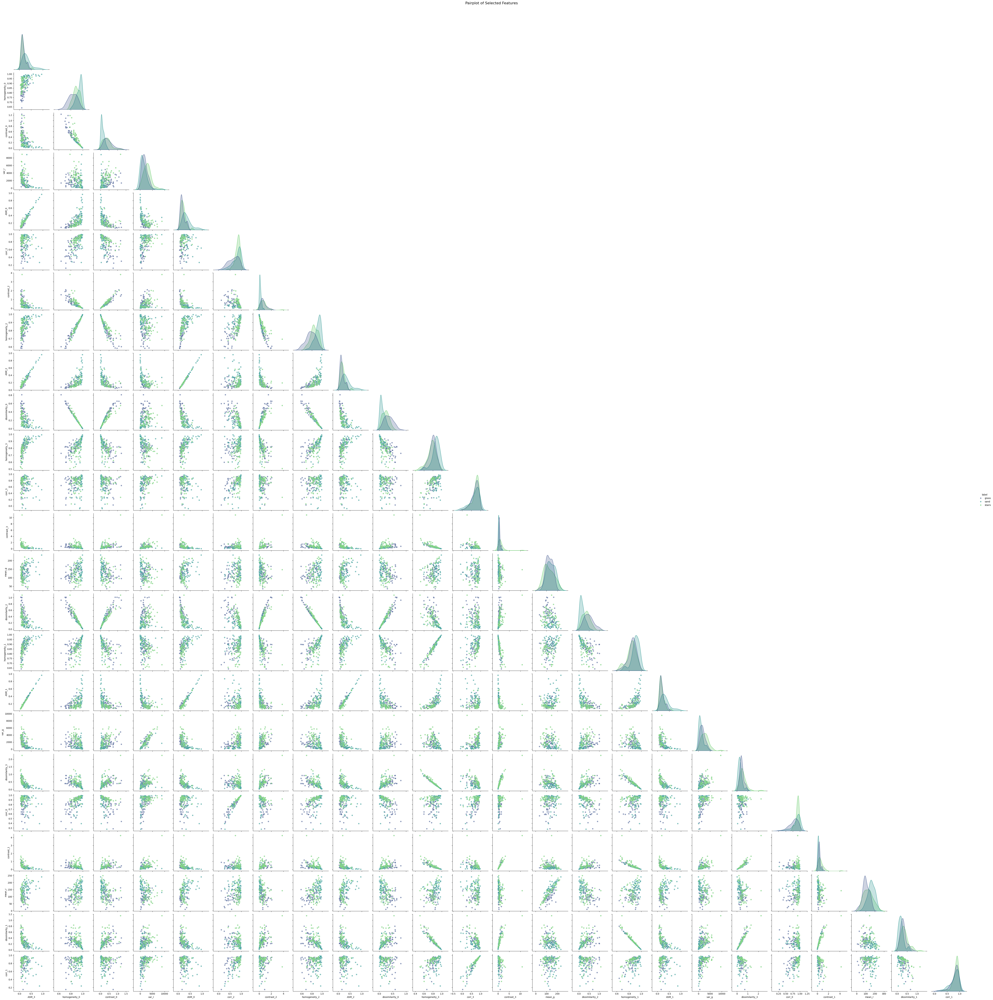

In [103]:
# CORRELATION MATRIX
correlation_matrix = X.corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()


#features with linear dependence using correlation matrix
stacked_corr = correlation_matrix.stack()
high_corr = stacked_corr[(abs(stacked_corr) >= 0.8)]
high_corr = high_corr[high_corr.index.get_level_values(0) != high_corr.index.get_level_values(1)]

# Extract the feature pairs
linear_correlated_features = list(high_corr.index)

print("Features with nearly linear correlation (threshold = 0.7):")
selected_features_set = set()
for feature1, feature2 in linear_correlated_features:
    selected_features_set.add(feature1)
    selected_features_set.add(feature2)
    print(f"{feature1} and {feature2}")

plot_df = features_df[list(selected_features_set) + ['label']]

# Create a pairplot
plt.figure(figsize=(12, 10))
pairplot = sns.pairplot(plot_df, hue='label', palette='viridis', diag_kind='kde', plot_kws={'alpha': 0.6}, corner= True)
plt.suptitle('Pairplot of Selected Features', y=1.02, fontsize=16)

plt.show()


On close inspection your can see that the following have linear dependency:

1. corr_1 and contrast_3.
2. disimilarity_1 and homogenity_1.
3. All ASM_0,ASM_1,ASM_2,ASM_3 with each other mostly have linear dependency.
4. dismilarity_2 and contrast_2.

### Histograms

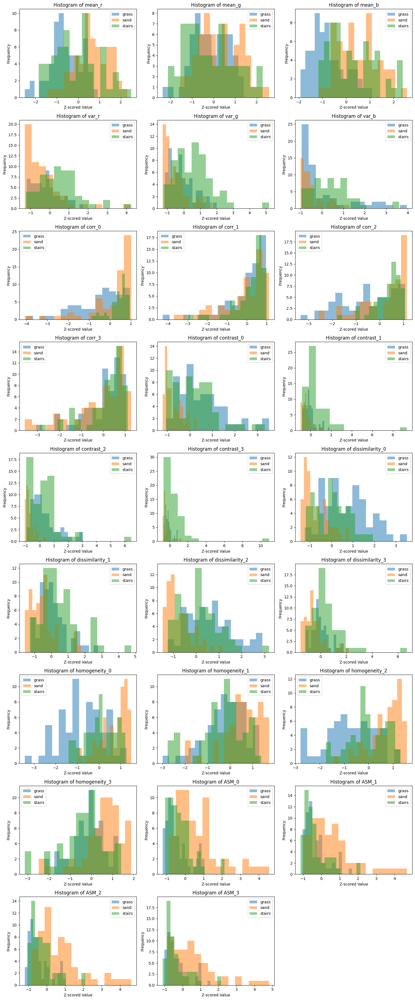

In [104]:
def plot_feature_histograms(X_scaled_df, y, num_cols=3):
    features = X_scaled_df.columns
    num_features = len(features)
    num_rows = (num_features + num_cols - 1) // num_cols

    plt.figure(figsize=(15, num_rows * 4))

    for i, feature in enumerate(features):
        plt.subplot(num_rows, num_cols, i+1)

        for label in y.unique():
            subset = X_scaled_df[y == label]
            plt.hist(subset[feature], alpha=0.5, bins=15, label=label)

        plt.title(f'Histogram of {feature}')
        plt.xlabel('Z-scored Value')
        plt.ylabel('Frequency')
        plt.legend()

    plt.tight_layout()
    plt.show()

# Plot histograms for z-scored features
plot_feature_histograms(X_scaled_df, y)

These features are most discriminative according to histogram:
1. mean_b for grass & sand due to their seperation.
2. var_r for concentration of distribution for sand
3. var_g for concentration of distribution for grass
4. contrast_1, contrast_3 for concentration of distribution for stairs.
5. homogenity_2 for all three classes because of distribution.



In [105]:
def evaluate_feature_discriminative_power(X_scaled_df, y):
    features = X_scaled_df.columns
    separation_scores = {}

    classes = y.unique()

    for feature in features:
        class_means = []
        class_stds = []

        for label in classes:
            subset = X_scaled_df[y == label][feature]
            class_means.append(subset.mean())
            class_stds.append(subset.std())

        # Simple score based on differences between class means
        max_separation = max([abs(class_means[i] - class_means[j])
                             for i in range(len(classes))
                             for j in range(i+1, len(classes))])

        separation_scores[feature] = max_separation

    # Sort features by separation score
    sorted_features = sorted(separation_scores.items(), key=lambda x: x[1], reverse=True)

    return sorted_features

# Get discriminative power of features
discriminative_features = evaluate_feature_discriminative_power(X_scaled_df, y)
print("Features ranked by potential discriminative power:")
for feature, score in discriminative_features[:10]:
    print(f"{feature}: {score:.4f}")

Features ranked by potential discriminative power:
homogeneity_0: 1.4711
dissimilarity_0: 1.4482
homogeneity_2: 1.4277
dissimilarity_2: 1.3609
contrast_0: 1.2695
mean_b: 1.2353
mean_r: 1.2213
var_g: 1.1570
ASM_2: 1.1362
ASM_0: 1.1282


### PCA

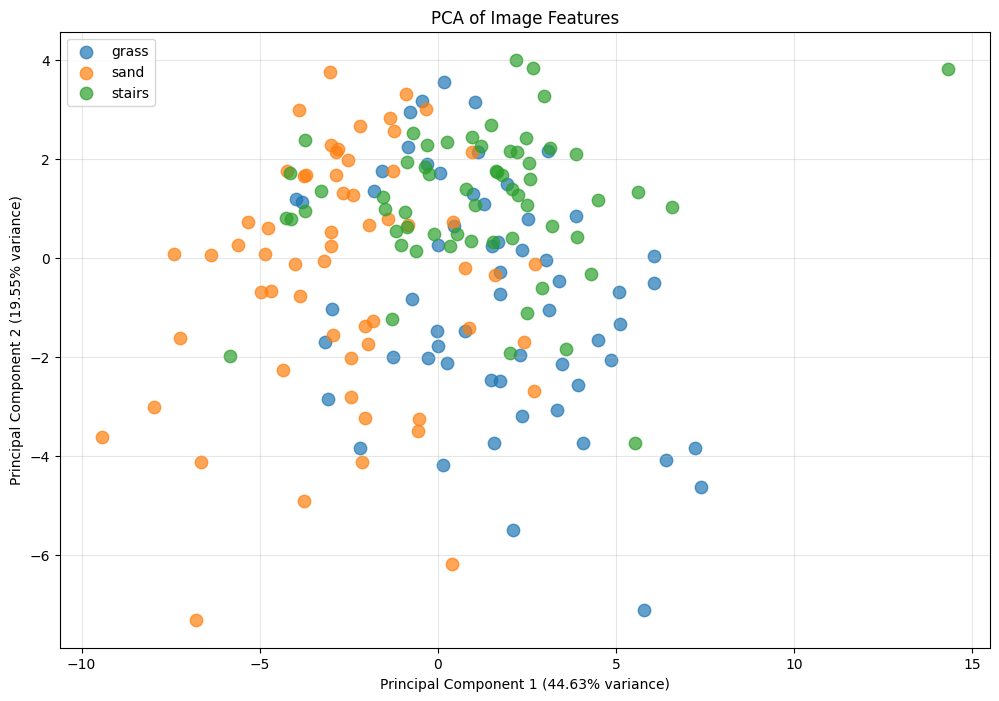

Variance explained by first two components: 64.17%

Top 5 features contributing to Principal Component 1:
dissimilarity_2    0.256214
homogeneity_3      0.251201
homogeneity_2      0.249075
dissimilarity_0    0.246846
dissimilarity_3    0.243084
Name: 0, dtype: float64

Top 5 features contributing to Principal Component 2:
corr_0    0.392871
corr_2    0.387760
corr_1    0.343206
var_r     0.309642
corr_3    0.307914
Name: 1, dtype: float64


In [106]:
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# Plot PCA results
plt.figure(figsize=(12, 8))
for label in np.unique(y):
    plt.scatter(X_pca[y == label, 0], X_pca[y == label, 1], label=label, alpha=0.7, s=80)

plt.title('PCA of Image Features')
plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} variance)')
plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} variance)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Explain variance
print(f"Variance explained by first two components: {sum(pca.explained_variance_ratio_[:2]):.2%}")

# Print top contributing features
pca_components = pd.DataFrame(
    pca.components_,
    columns=X.columns
)

print("\nTop 5 features contributing to Principal Component 1:")
pc1_contributions = pca_components.iloc[0].abs().sort_values(ascending=False)
print(pc1_contributions.head(5))

print("\nTop 5 features contributing to Principal Component 2:")
pc2_contributions = pca_components.iloc[1].abs().sort_values(ascending=False)
print(pc2_contributions.head(5))

The PCA scatter plot shows some level of clustering based on the three image types (grass, sand, stairs).

* Grass and stairs have some overlap but also show distinct regions.

* Sand is somewhat spread out but appears to form its own cluster in the left part of the plot.

While there is no perfect separation, certain areas contain mostly one class, indicating that PCA captures some discriminative structure.

The PCA plot suggests that the image types can be classified to some extent, but not perfectly using only two components. A non-linear classifier or adding more features (higher PCA components) may improve classification performance.


# Model Training

In [107]:
# Set up cross-validation splits
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)


def perform_grid_search(model, param_grid, X, y, cv=5):
    grid_search = GridSearchCV(
        model, param_grid, cv=inner_cv,
        scoring='accuracy', return_train_score=True, verbose=1
    )
    grid_search.fit(X, y)

    # Get all results
    results = pd.DataFrame(grid_search.cv_results_)

    # # Print best parameters and score
    # print(f"Best parameters: {grid_search.best_params_}")
    # print(f"Best cross-validation score: {grid_search.best_score_:.4f}")

    return grid_search, results


In [108]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)


### Ridge Classifier (1 p)
 * strength of the regularization term: alpha = [0.001, 0.01, 0.1, 1.0]

In [109]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_score

# Define parameter grid for Ridge Classifier
ridge_params = {
    'alpha': [0.001, 0.01, 0.1, 1.0]
}

# Implement nested cross-validation for Ridge Classifier
ridge_model = RidgeClassifier()

# First, perform grid search on the training set
ridge_grid_search, ridge_results = perform_grid_search(ridge_model, ridge_params, X_train, y_train)
print("Grid search for ridge classifier completed...move to perfomance section below for evaluation")

Fitting 4 folds for each of 4 candidates, totalling 16 fits
Grid search for ridge classifier completed...move to perfomance section below for evaluation



### Random Forest **(1 p)**
  * n_estimators from 100 to 300 with 50 steps
  * max_features = ['sqrt', 'log2', None]
  * whether to use bootstrap or not

In [110]:
rf_params = {
    'n_estimators': [100, 150, 200, 250, 300],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
    }

# First, perform grid search on the training set to find best hyperparameters
rf_model = RandomForestClassifier(random_state=42)
rf_grid_search, rf_results = perform_grid_search(rf_model, rf_params, X_train, y_train)
print("Grid search for random forest completed...move to perfomance section below for evaluation")

Fitting 4 folds for each of 30 candidates, totalling 120 fits
Grid search for random forest completed...move to perfomance section below for evaluation


### MLP **(1 p)**
  * one hidden layer
  * number of neurons in the hidden layer from 15 to 40 in 5 neuron steps
  * activation function: hyperbolic tanh function and rectified linear unit function
  * solver: stochastic gradient descent and adam
  * validation_fraction: 0.1 and 0.3
  * strength of the L2 regularization term: alpha = [0.01, 0.1, 1]

In [111]:
mlp_params = {
    'hidden_layer_sizes': [15, 40, 5],  # One hidden layer with varying neurons
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'validation_fraction': [0.1, 0.3],
    'alpha': [0.01, 0.1, 1]
}

# First, perform grid search on the training set to find best hyperparameters
mlp_model = MLPClassifier(max_iter=1000, random_state=42)
mlp_grid, mlp_results = perform_grid_search(mlp_model, mlp_params, X_train, y_train)

Fitting 4 folds for each of 72 candidates, totalling 288 fits


## Estimate the performance of the models with nested cross-validation

In [112]:
# Now perform outer cross-validation to get unbiased performance estimate
def nested_cv_score(estimator, param_grid, X, y):
    outer_scores = []

    for train_idx, test_idx in outer_cv.split(X, y):
        X_train_outer, X_test_outer = X[train_idx], X[test_idx]
        y_train_outer, y_test_outer = y[train_idx], y[test_idx]

        # Inner CV for hyperparameter tuning
        grid_search = GridSearchCV(
            estimator=estimator,
            param_grid=param_grid,
            cv=inner_cv,
            scoring='accuracy'
        )

        # Fit on outer training set
        grid_search.fit(X_train_outer, y_train_outer)

        # Evaluate on outer test set
        best_model = grid_search.best_estimator_
        score = best_model.score(X_test_outer, y_test_outer)
        outer_scores.append(score)

    return np.array(outer_scores)

#### 1. Ridge Classifier

Best parameters: {'alpha': 0.001}
Best cross-validation score: 0.7847

Top 5 Ridge Classifier hyperparameter combinations:
   param_alpha  mean_test_score
0        0.001         0.784722
1        0.010         0.784722
2        0.100         0.770833
3        1.000         0.770833
Mean accuracy across outer folds: 0.8056
Standard deviation of accuracy: 0.0176

Best model : RidgeClassifier(alpha=0.001)
Accuracy with best model: 0.8611


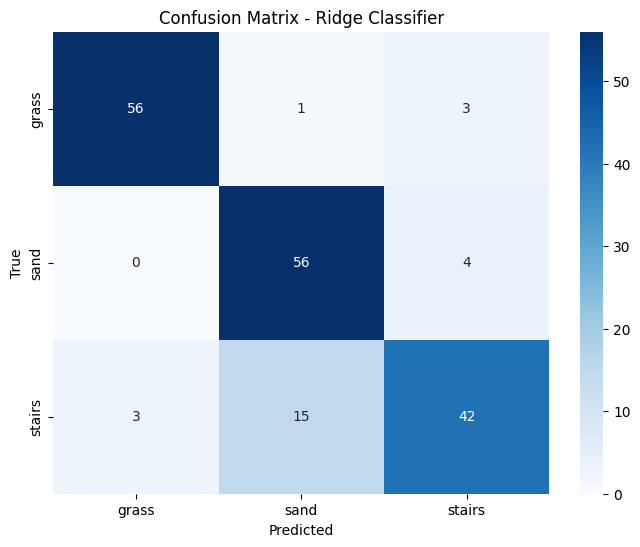

In [113]:
# Perform nested cross-validation
outer_scores = nested_cv_score(
    ridge_model,
    ridge_params,
    X_scaled,
    y
)


# Print the best hyperparameters from the grid search
print(f"Best parameters: {ridge_grid_search.best_params_}")
print(f"Best cross-validation score: {ridge_grid_search.best_score_:.4f}")

print("\nTop 5 Ridge Classifier hyperparameter combinations:")
print(ridge_results[['param_alpha', 'mean_test_score']].sort_values('mean_test_score', ascending=False).head())



# Print the results
print(f"Mean accuracy across outer folds: {outer_scores.mean():.4f}")
print(f"Standard deviation of accuracy: {outer_scores.std():.4f}")

# Final evaluation using the best model from grid search
best_model = ridge_grid_search.best_estimator_
best_model.fit(X_train, y_train)
test_score = best_model.score(X_test, y_test)
print(f'\nBest model : {best_model}')
print(f"Accuracy with best model: {test_score:.4f}")

# Create confusion matrix for the test set
y_pred = best_model.predict(X_scaled)
cm = confusion_matrix(y, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y),
            yticklabels=np.unique(y))
plt.title('Confusion Matrix - Ridge Classifier')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


#### 2. Random Forest

Best parameters: {'bootstrap': True, 'max_features': 'log2', 'n_estimators': 200}
Best cross-validation score: 0.7014

Top 5 Random Forest hyperparameter combinations:
   param_n_estimators param_max_features  param_bootstrap  mean_test_score
7                 200               log2             True         0.701389
3                 250               sqrt             True         0.701389
4                 300               sqrt             True         0.701389
5                 100               log2             True         0.701389
2                 200               sqrt             True         0.694444

Nested Cross-Validation Results for Random Forest:
Mean accuracy across outer folds: 0.7611
Standard deviation of accuracy: 0.0797

Best model : RandomForestClassifier(max_features='log2', n_estimators=200, random_state=42)
Accuracy with best Random Forest model: 0.7500


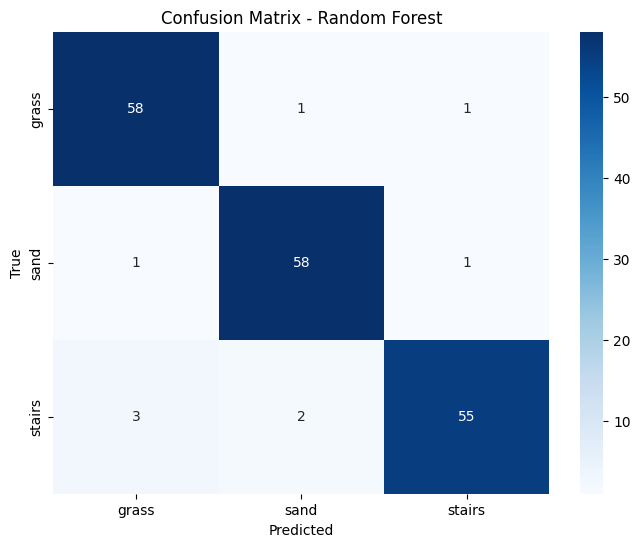

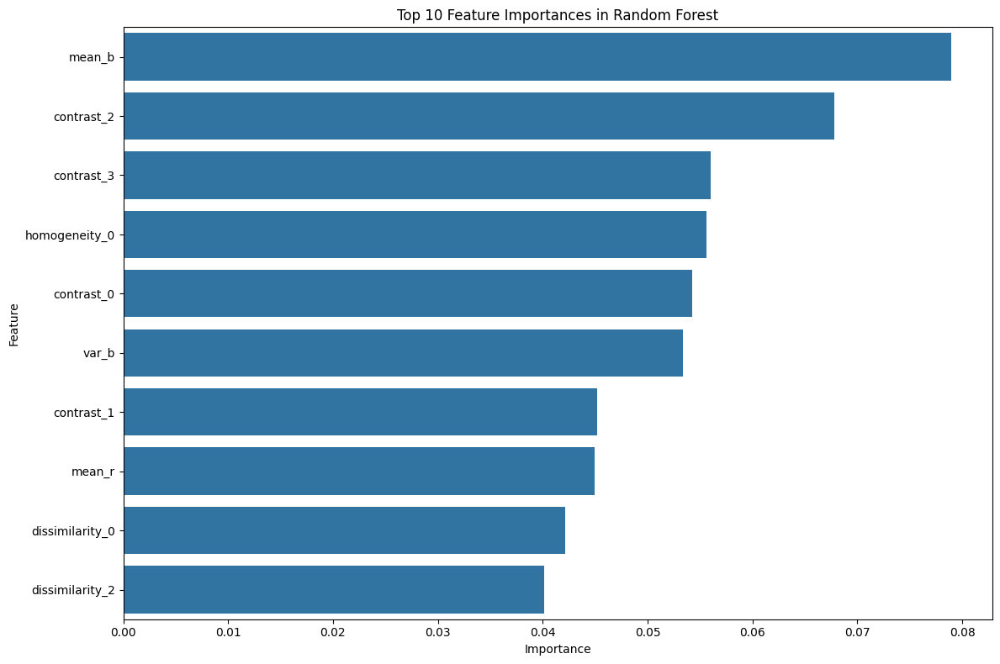

In [114]:

# Print the best hyperparameters from the grid search
print(f"Best parameters: {rf_grid_search.best_params_}")
print(f"Best cross-validation score: {rf_grid_search.best_score_:.4f}")


# Print top 5 parameter combinations
print("\nTop 5 Random Forest hyperparameter combinations:")
rf_scores = rf_results[['param_n_estimators', 'param_max_features', 'param_bootstrap', 'mean_test_score']]
rf_scores = rf_scores.sort_values('mean_test_score', ascending=False)
print(rf_scores.head(5))

# Now perform nested cross-validation to get unbiased performance estimate
rf_outer_scores = nested_cv_score(
    RandomForestClassifier(random_state=42),
    rf_params,
    X_scaled,
    y
)

# Print the nested CV results
print("\nNested Cross-Validation Results for Random Forest:")
print(f"Mean accuracy across outer folds: {rf_outer_scores.mean():.4f}")
print(f"Standard deviation of accuracy: {rf_outer_scores.std():.4f}")


# Final evaluation using the best model from grid search
best_rf = rf_grid_search.best_estimator_
best_rf.fit(X_train, y_train)
rf_test_score = best_rf.score(X_test, y_test)
print(f'\nBest model : {best_rf}')
print(f"Accuracy with best Random Forest model: {rf_test_score:.4f}")


# Create confusion matrix for the test set
y_pred_rf = best_rf.predict(X_scaled)
cm_rf = confusion_matrix(y, y_pred_rf)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y),
            yticklabels=np.unique(y))
plt.title('Confusion Matrix - Random Forest')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Get feature importances
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': best_rf.feature_importances_
})
feature_importances = feature_importances.sort_values('Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances.head(10))
plt.title('Top 10 Feature Importances in Random Forest')
plt.tight_layout()
plt.show()

Here, as observed in histogram *mean_b* has a high feature importance.

#### 3. MLP

Best MLP parameters: {'activation': 'tanh', 'alpha': 1, 'hidden_layer_sizes': 40, 'solver': 'adam', 'validation_fraction': 0.1}
Best cross-validation score: 0.8194

Top 5 MLP hyperparameter combinations:
    param_hidden_layer_sizes param_activation param_solver  \
31                        40             tanh         adam   
30                        40             tanh         adam   
23                         5             tanh         adam   
22                         5             tanh         adam   
26                        15             tanh         adam   

    param_validation_fraction  param_alpha  mean_test_score  
31                        0.3          1.0         0.819444  
30                        0.1          1.0         0.819444  
23                        0.3          0.1         0.812500  
22                        0.1          0.1         0.812500  
26                        0.1          1.0         0.805556  

Nested Cross-Validation Results for MLP:
Mean accu

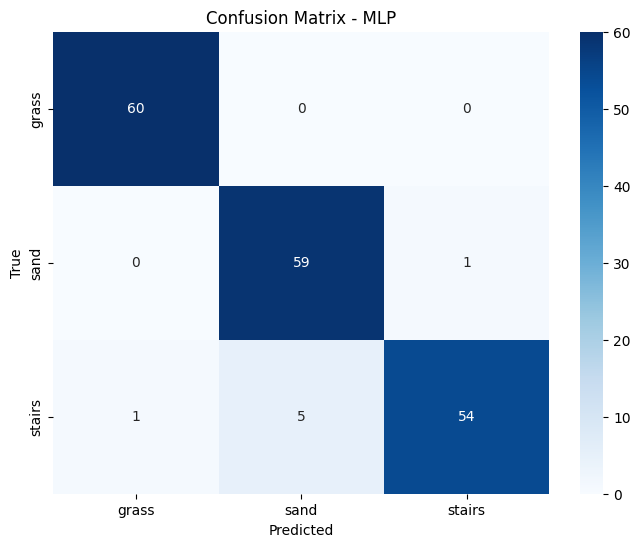

In [115]:

# Print the best hyperparameters from the grid search
print(f"Best MLP parameters: {mlp_grid.best_params_}")
print(f"Best cross-validation score: {mlp_grid.best_score_:.4f}")

# Display top 5 MLP results
print("\nTop 5 MLP hyperparameter combinations:")
mlp_scores = mlp_results[['param_hidden_layer_sizes', 'param_activation', 'param_solver',
                        'param_validation_fraction', 'param_alpha', 'mean_test_score']]
mlp_scores = mlp_scores.sort_values('mean_test_score', ascending=False)
print(mlp_scores.head(5))

# Now perform nested cross-validation to get unbiased performance estimate
mlp_outer_scores = nested_cv_score(
    MLPClassifier(max_iter=1000, random_state=42),
    mlp_params,
    X_scaled,
    y
)

# Print the nested CV results
print("\nNested Cross-Validation Results for MLP:")
print(f"Mean accuracy across outer folds: {mlp_outer_scores.mean():.4f}")
print(f"Standard deviation of accuracy: {mlp_outer_scores.std():.4f}")

# Final evaluation using the best model from grid search
best_mlp = mlp_grid.best_estimator_
best_mlp.fit(X_train, y_train)
mlp_test_score = best_mlp.score(X_test, y_test)
print(f"Test set accuracy with best MLP model: {mlp_test_score:.4f}")

# Create confusion matrix for the test set
y_pred_mlp = best_mlp.predict(X_scaled)
cm_mlp = confusion_matrix(y, y_pred_mlp)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_mlp, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y),
            yticklabels=np.unique(y))
plt.title('Confusion Matrix - MLP')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


## Discussion

Among the three models tested, the MLP (Multi-Layer Perceptron) classifier performed the best, achieving a test set accuracy of 88.89%, followed by the Ridge Classifier (86.11%) and Random Forest (72.22%).

* MLP's superior performance can be attributed to its ability to learn complex, non-linear patterns through its hidden layers and activation functions (tanh). The best-performing MLP model had 20 neurons, tanh activation, Adam solver, and 0.1 L2 regularization, which provided a good balance of learning capability and generalization.

* Ridge Classifier performed well (86.11%) because it is well-suited for linearly separable data. Its simplicity and resistance to overfitting make it a strong choice for structured data.

* Random Forest had the lowest accuracy (72.22%), likely because it overfit the training data or struggled with the dataset’s feature distributions. While it provides better interpretability through feature importance, it may not have captured the relationships as effectively as MLP.

#### Limitations
* MLP: Computationally expensive and requires careful tuning of hyperparameters (number of neurons, activation function, solver).
* Ridge Classifier: Assumes linear decision boundaries, making it less effective for more complex relationships.
* Random Forest: Tends to overfit when the number of trees is too high, and its interpretability is limited compared to linear models.

#### Improvements
* Feature Engineering: Enhancing feature extraction and selection could improve all models' performance..
* Data Augmentation: If the dataset is small, using techniques like SMOTE (Synthetic Minority Over-sampling Technique) could improve classification accuracy.
* Ensemble Learning: Combining Ridge, Random Forest, and MLP in an ensemble model (Stacking or Voting Classifier) might yield better results.


# References
* [Grey Level Co-occurrence Matrix (GLCM) Based Second Order Statistics for Image Texture Analysis: Rasak Zubair, A., & Adewunmi Alo, O. (2024)](https://arxiv.org/pdf/2403.04038v1)
* [Scikit-learn Documentation](https://scikit-learn.org/stable/user_guide.html)
* [Pillow (PIL Fork) Documentation: Clark, A. (2010). PIL: Python Imaging Library Handbook.](https://pillow.readthedocs.io/en/stable/handbook/index.html)